In [1]:
# !pip install opencv-python matplotlib numpy
import os
import sys
import re
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Function to draw OBBs on an image
def draw_obb(image, obb_labels, width, height, scale=1, color=(255, 0, 0), plot_center=False):
    overlay = image.copy()
    line_tickness = max(1, int(scale/2))
    for obb in obb_labels:
        points = np.array(list(map(float, obb[1:9]))).reshape((4, 2))
        label = obb[0]
        # score = obb[9]
        # Convert normalized coordinates to absolute pixel values
        points[:, 0] *= width  # Convert x-coordinates
        points[:, 1] *= height # Convert y-coordinates
        # points *= scale  # Scale if needed
        points = points.astype(int)
        # Draw edges
        for i in range(4):
            p1, p2 = tuple(points[i]), tuple(points[(i + 1) % 4])
            cv2.line(overlay, p1, p2, color, line_tickness)
        # draw center
        if plot_center:
            center = np.mean(points, axis=0).astype(int)
            cv2.circle(overlay, tuple(center), 5, (0, 0, 255), -1)
    return overlay

# Read annotation file
def read_anns(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    annotations = []
    for line in lines:
        parts = line.strip().split()
        # print(parts)
        annotations.append(parts)
    return annotations

In [3]:
def plot_images_with_annotations(input_dir, high_res_dir, gt_ann_dir, pred_ann_dir, num_images=10, scale=1):
    input_images = sorted(glob.glob(os.path.join(input_dir, '*.tif')))
    high_res_images = sorted(glob.glob(os.path.join(high_res_dir, '*.tif')))
    # high_res_images = [os.path.join(high_res_dir, str(i)+'.png') for i in range(len(input_images))]
    num_images = min(num_images, len(input_images))
    print(f"Found {len(input_images)} input images and {len(high_res_images)} high-res images.")
    fig, axes = plt.subplots(num_images, 2, figsize=(15, 8 * num_images))
    for i in range(num_images):
        input_image_path = input_images[i]
        high_res_image_path = high_res_images[i]
        basename = os.path.splitext(os.path.basename(input_image_path))[0]
        input_image = cv2.imread(input_image_path)
        high_res_image = cv2.imread(high_res_image_path)
        if input_image is None or high_res_image is None:
            print(f"Skipping image pair {i+1}: Could not load one of the images.")
            continue
        input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
        high_res_image = cv2.cvtColor(high_res_image, cv2.COLOR_BGR2RGB)
        # Read annotations
        gt_ann_path = os.path.join(gt_ann_dir, f"{basename}.txt")
        pred_ann_path = os.path.join(pred_ann_dir, f"{basename}.txt")
        gt_labels = read_anns(gt_ann_path) if os.path.exists(gt_ann_path) else []
        pred_labels = read_anns(pred_ann_path) if os.path.exists(pred_ann_path) else []
        # Draw annotations
        input_annotated = draw_obb(input_image.copy(), gt_labels, input_image.shape[1], input_image.shape[0])
        highres_annotated = draw_obb(high_res_image.copy(), pred_labels, high_res_image.shape[1], high_res_image.shape[0], scale=scale)
        # Plot
        axes[i, 0].imshow(input_annotated)
        axes[i, 0].axis('off')
        axes[i, 0].set_title(f'Input {i + 1}', fontsize=14)
        axes[i, 1].imshow(highres_annotated)
        axes[i, 1].axis('off')
        axes[i, 1].set_title(f'High Res Output {i + 1}, Scale: {scale}', fontsize=14)
    plt.tight_layout()
    plt.savefig('image_pairs_with_annotations.png', dpi=300)
    plt.show()


In [ ]:
input_dir = "./data/bihar/train/images"
high_res_dir = "./results/bihar_thera/ours_images_rdn/"
gt_ann_dir = "./data/bihar/train/labels/"
num_images = 5
scale = 4


Processing scale 4...
Found 641 input images and 10 high-res images.


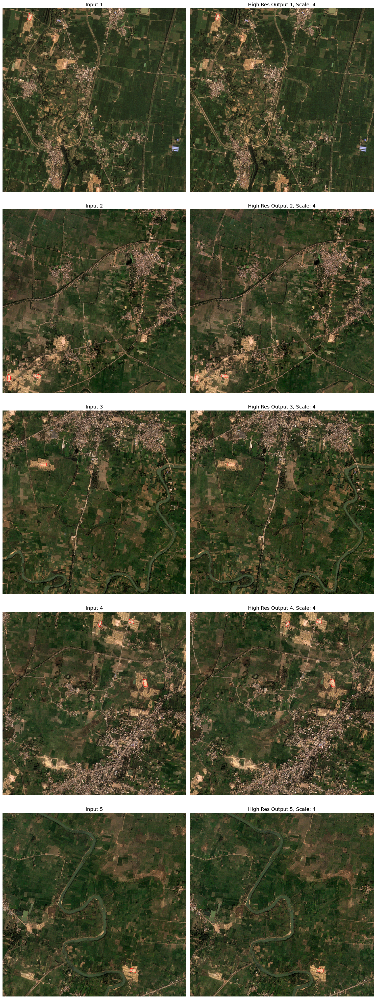

In [ ]:
print(f"Processing scale {scale}...")
high_res_folder = os.path.join(high_res_dir, f"{scale}")
plot_images_with_annotations(input_dir, high_res_folder, gt_ann_dir, gt_ann_dir, num_images=num_images, scale=scale)